In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as transforms

import scipy as sp
from scipy import signal
from scipy.io import wavfile

from IPython.display import Audio, display

%matplotlib inline

In [2]:
def play(x, fs, autoplay=False):
    display(Audio(x, rate=fs, autoplay=autoplay))

In [3]:
def plot_signal(t_wav0,wav0,xlim=None,title=None):
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(t_wav0,wav0)
    ax.set_xticklabels([])
    ax.set_ylabel('x(t)')
    ax.set_xlim(xlim)
    ax.set_title(title)

    ax = fig.add_subplot(2,1,2)
    samplerate = 1./(t_wav0[1]-t_wav0[0])
    ax.specgram(wav0,Fs=samplerate)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Hz')
    ax.set_xlim(xlim)

    fig.tight_layout()
    plt.show()
    plt.close(fig)

In [4]:
def plot_noise(t_wav0,wav0,xlim=None,title=None):
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(t_wav0,wav0)
    ax.set_xticklabels([])
    ax.set_ylabel('x(t)')
    ax.set_xlim(xlim)
    ax.set_title(title)

    ax = fig.add_subplot(2,1,2)
    samplerate = 1./(t_wav0[1]-t_wav0[0])
    ax.specgram(wav0,Fs=samplerate)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Hz')
    ax.set_xlim(xlim)

    fig.tight_layout()
    plt.show()
    plt.close(fig)

In [5]:
def extract(wav, t1, t2, fs):
    ''' Extract a portion of the input signal from t1 to t2 '''
    cut = wav[t1*fs:t2*fs]
    tcut = np.arange(len(cut))*(1./fs)
    return cut, tcut

In [6]:
# Matplotlib settings to make the plots look a little nicer.

plt.rcParams['font.size']      = 18
plt.rcParams['font.weight']    = 'bold'
plt.rcParams['axes.grid']      = True
plt.rcParams['axes.xmargin']   = 0
plt.rcParams['grid.linestyle'] = ':'
plt.rcParams['figure.figsize'] = (10,6)

# Load N6GN_20211115T190749_iq_15.wav file (or any of the other wav file signals)

In [7]:
# Note that IQ WAV files look like regular stereo WAV files, but instead of 
# the channels representing the left and right speakers, they represent the
# I and Q signals.

fname          = 'N6GN_20211115T190749_iq_15.wav'
samplerate, iq = wavfile.read(fname)
time_vec       = np.arange(len(iq))*(1./samplerate)

print('Sample Rate: {!s} samples/sec'.format(samplerate))
print('Number of Channels: {!s}'.format(iq.shape[1]))
print('Data Type: {!s}'.format(iq.dtype))

Sample Rate: 20249 samples/sec
Number of Channels: 2
Data Type: float32


# AM Demdodulation and Save to New WAV File

In [8]:
iq_float = iq / (np.max(np.abs(iq))+1.0) 

In [9]:
# Now do the AM demodulation.
am = np.sqrt(iq_float[:,0]**2 + iq_float[:,1]**2)



In [10]:
# Write the demodulated signal to a new WAV file.
fname_am = 'AMDEMOD-'+fname
wavfile.write(fname_am,samplerate,am.astype(np.float32))

# Playing N6GN_20211115T190749_iq_15.wav Test File

In [11]:
# We can play the sound
play(am,samplerate)

# Plot IQ Data

In [12]:
# To calculate the IQ spectrum, we need to first convert it into a complex vector.
iq_complex = iq[:,0] + 1j*iq[:,1]

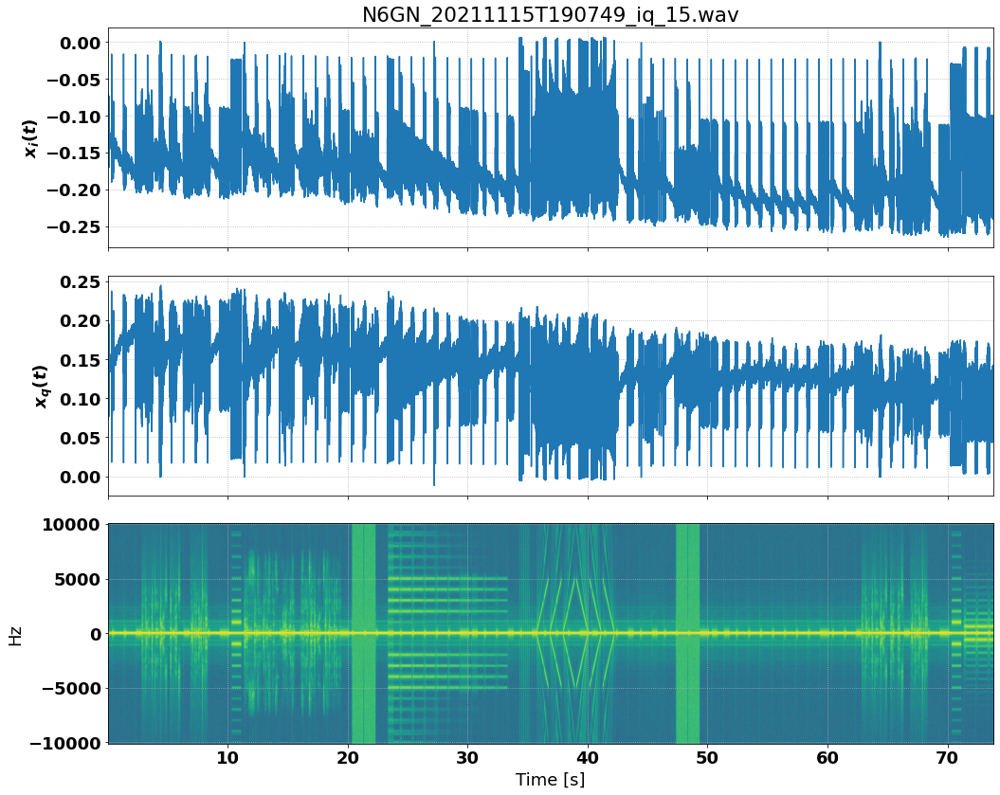

In [13]:
xlim = None

fig = plt.figure(figsize=(15,12))

ax = fig.add_subplot(3,1,1)
ax.plot(time_vec,iq[:,0])
ax.set_xticklabels([])
ax.set_ylabel('$x_i(t)$')
ax.set_xlim(xlim)
ax.set_title(fname)

ax = fig.add_subplot(3,1,2)
ax.plot(time_vec,iq[:,1])
ax.set_xticklabels([])
ax.set_ylabel('$x_q(t)$')
ax.set_xlim(xlim)

ax = fig.add_subplot(3,1,3)
ax.specgram(iq_complex,Fs=samplerate)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Hz')
ax.set_xlim(xlim)

fig.tight_layout()
plt.show()
plt.close(fig)

# Plot Demodulated Data

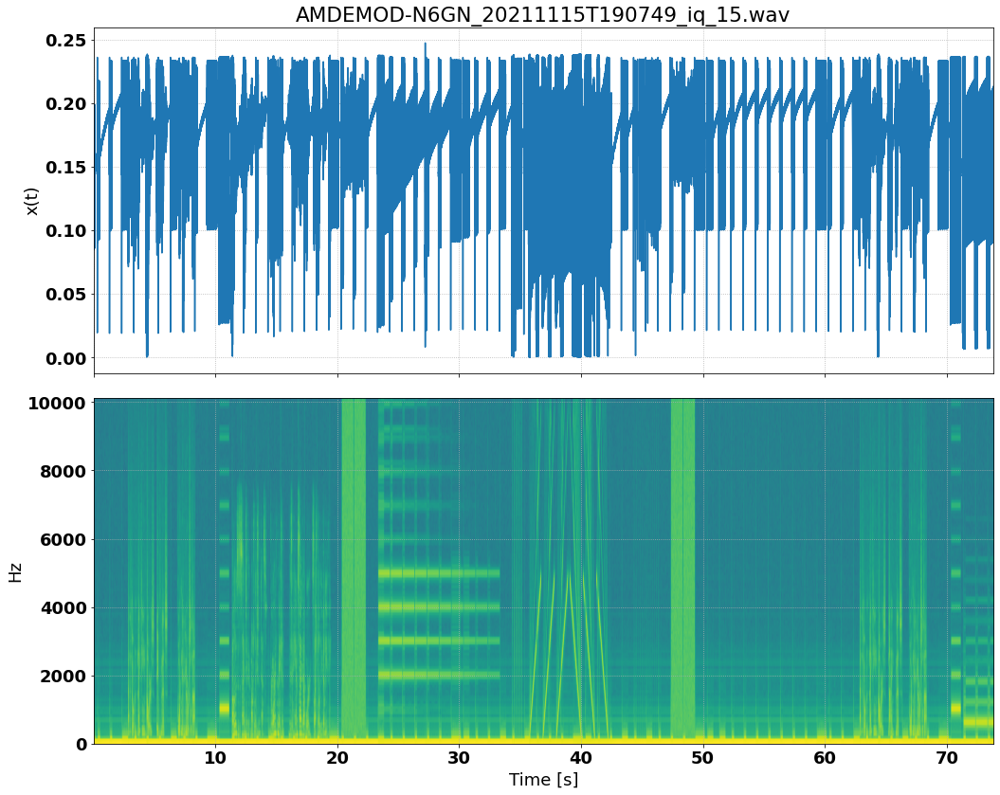

In [14]:
xlim = None

fig = plt.figure(figsize=(15,12))

ax = fig.add_subplot(2,1,1)
ax.plot(time_vec,am)
ax.set_xticklabels([])
ax.set_ylabel('x(t)')
ax.set_xlim(xlim)
ax.set_title(fname_am)

ax = fig.add_subplot(2,1,2)
ax.specgram(am,Fs=samplerate)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Hz')
ax.set_xlim(xlim)

fig.tight_layout()
plt.show()
plt.close(fig)

# Signal to Noise Ratio (SNR)

SNR is the signal power in dB minus the noise power in dB.

For a manuafacturerd signal, you can easily calculate the signal power since you know exactly what the signal is. You can then atificially add noise of a known amplitude to the signal.

For a collected signal, you can calcuate a DFT and take the power from frequency bins where the signal is known to exist and subtract from it power from frequency bins where it is known there will be no signal.

# Manufactured Signal

In [15]:
fname = 'test.wav'

# Load in the file and detect the sampling frequency
fs_wav0, wav0 = wavfile.read(fname)

# We need a new time vector because because the WAV file is a different length than the
t_wav0 = np.arange(len(wav0))*(1/fs_wav0)

In [16]:
N  = 2016000
Fs = 1000
t  = np.arange(N)/Fs
sigma = 0.1
s = signal.chirp(t,100,1,300)
n = sigma*np.random.randn(N)



In [17]:
s_pwr    = np.sum(np.abs(s)**2)/N
s_pwr_db = 10*np.log10(s_pwr)
print('s_pwr: {!s}'.format(s_pwr))
print('s_pwr dB: {!s}'.format(s_pwr_db))

n_pwr    = np.sum(np.abs(n)**2)/N
n_pwr_db = 10*np.log10(n_pwr)
print('n_pwr: {!s}'.format(n_pwr))
print('n_pwr dB: {!s}'.format(n_pwr_db))

snr_db = s_pwr_db - n_pwr_db

s_pwr: 0.5070675609809502
s_pwr dB: -2.9493417201492713
n_pwr: 0.009988312043288643
n_pwr dB: -20.005078983830153


C:\Users\alpha\Downloads\Anacanda\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


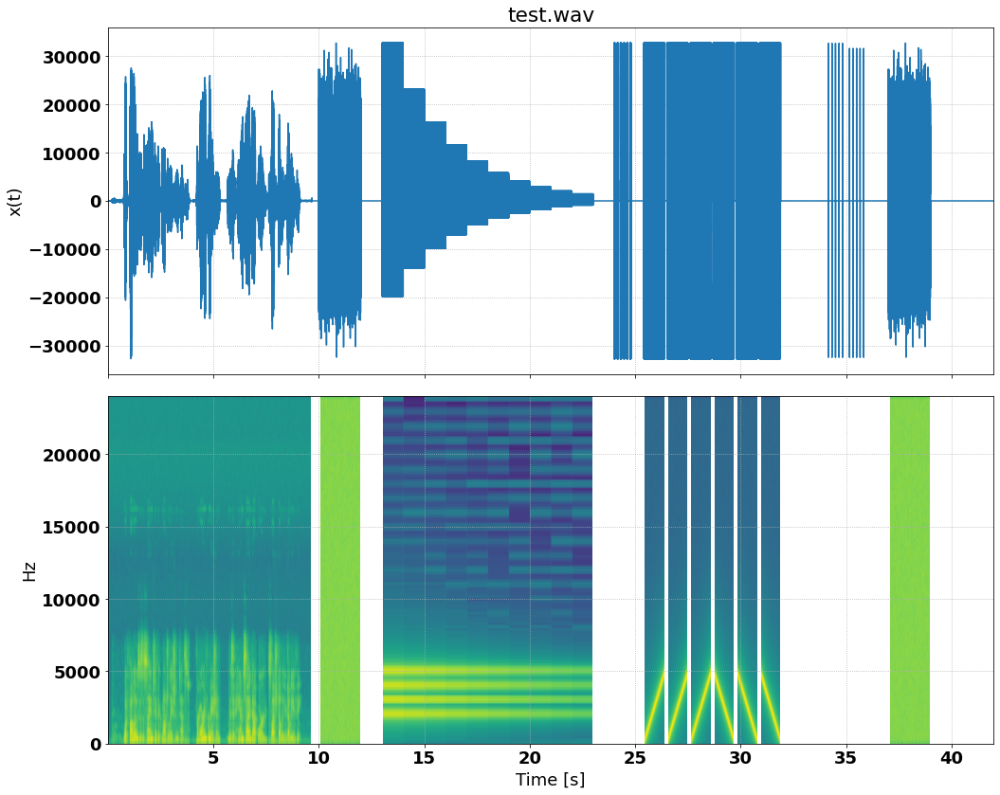

In [18]:
plot_signal(t_wav0, wav0, None,'test.wav')

In [19]:
voice, t_voice = extract(wav0, 30, 31, fs_wav0)

C:\Users\alpha\Downloads\Anacanda\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


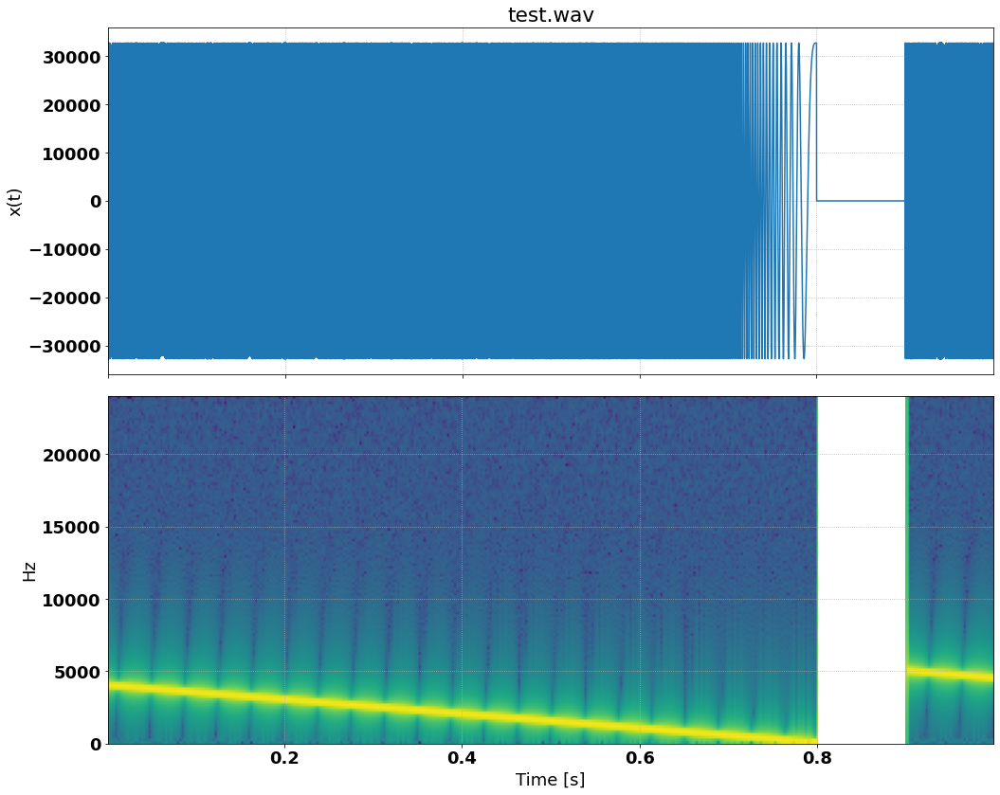

In [20]:
plot_signal(t_voice, voice, None,'test.wav')

# Extract Manufactured Signal

In [21]:
voice, t_voice = extract(wav0, 0, 10, fs_wav0)

C:\Users\alpha\Downloads\Anacanda\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


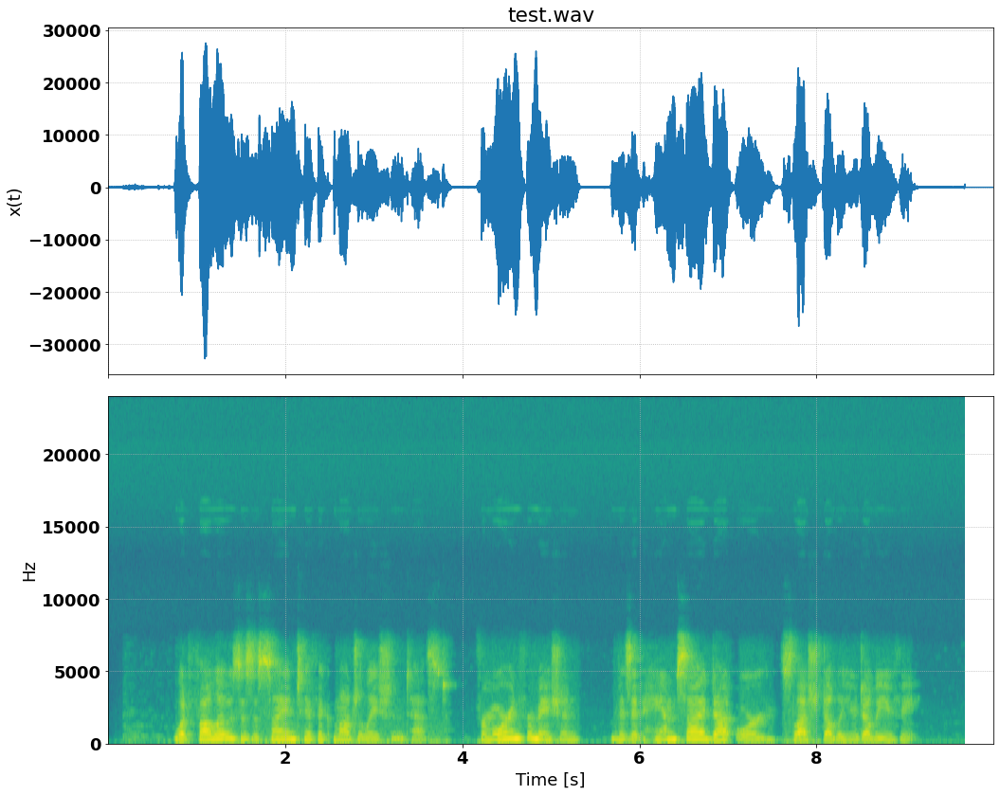

In [22]:
plot_signal(t_voice, voice, None,'test.wav')

C:\Users\alpha\Downloads\Anacanda\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


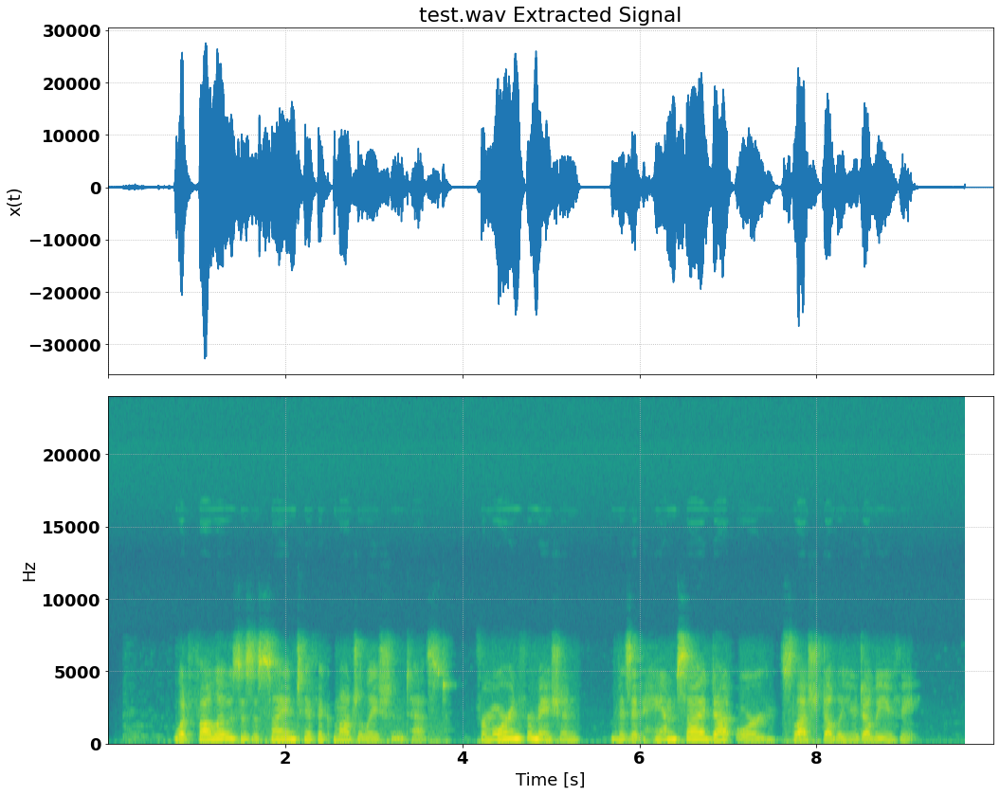

In [23]:
plot_signal(t_voice, voice, title='test.wav Extracted Signal')

C:\Users\alpha\Downloads\Anacanda\lib\site-packages\matplotlib\axes\_axes.py:7553: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


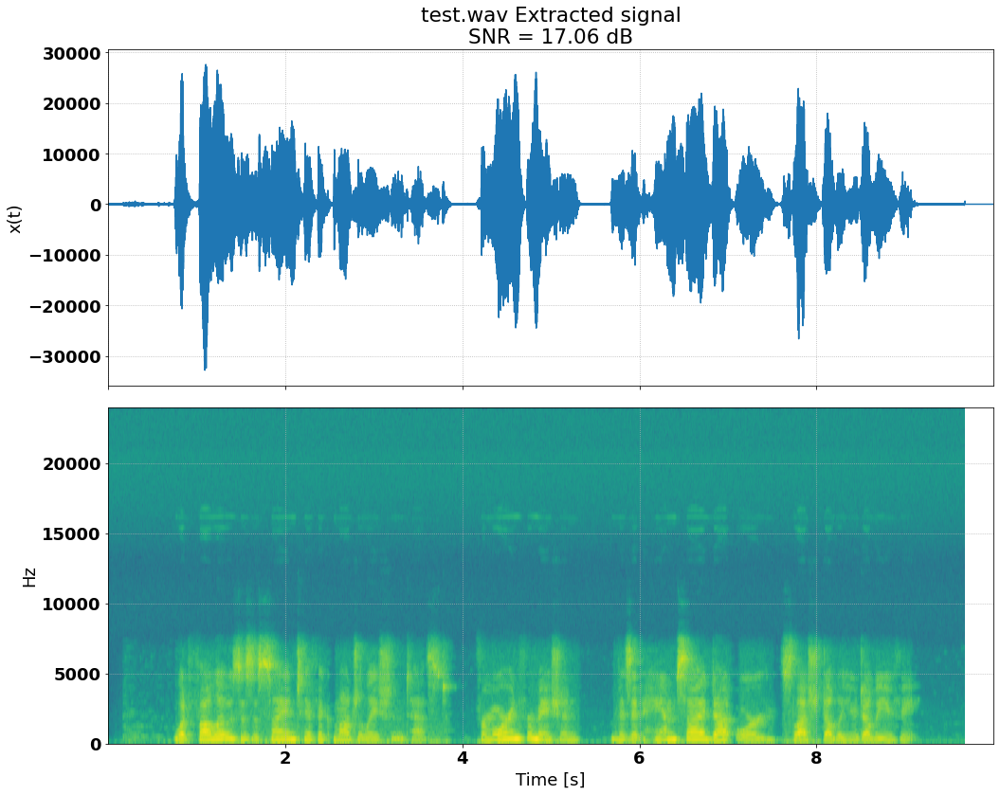

In [24]:
plot_signal(t_voice,voice,None,'test.wav Extracted signal\nSNR = {:0.2f} dB'.format(snr_db))

# Collected Signal

# Load N6GN_20211115T190749_iq_15.wav file (or any of the other wav file collected signals)

In [25]:
fname1 = 'AMDEMOD-N6GN_20211115T190749_iq_15.wav'

# Load in the file and detect the sampling frequency
fs_wav1, wav1 = wavfile.read(fname1)

# Create a time vector

N = len(wav1)

In [26]:
play(wav1,Fs)

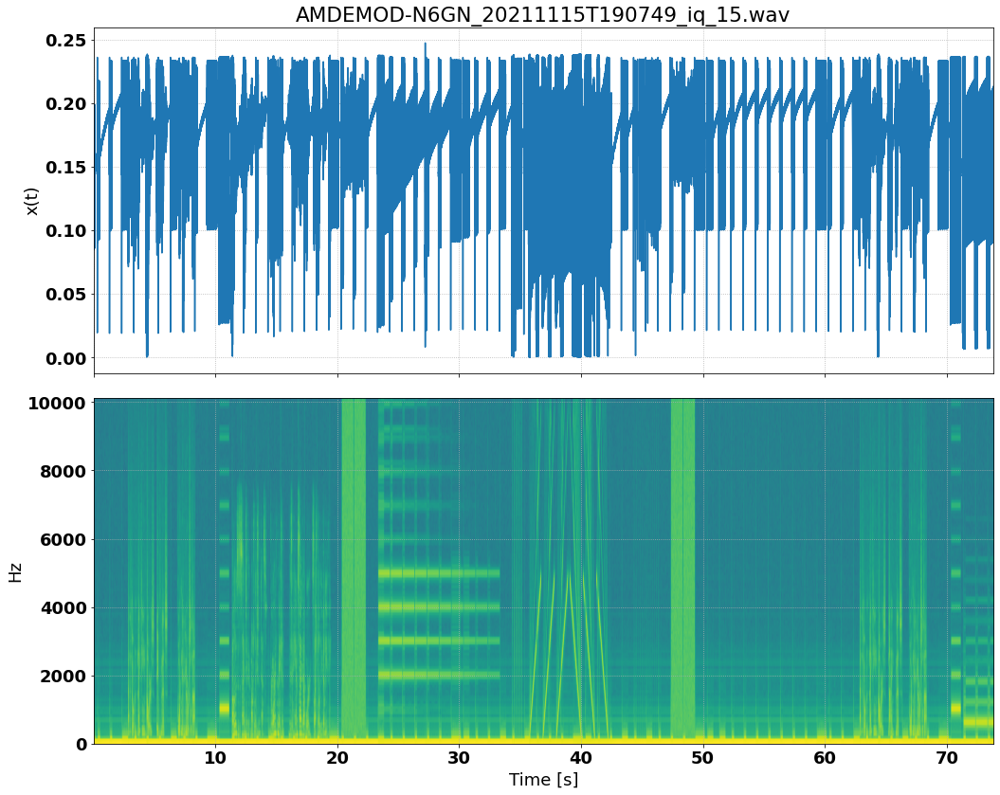

In [27]:
plot_signal(time_vec,wav1, title='AMDEMOD-N6GN_20211115T190749_iq_15.wav')

# Extract Signal

In [28]:
s, t = extract(wav1, 38, 39, fs_wav1)

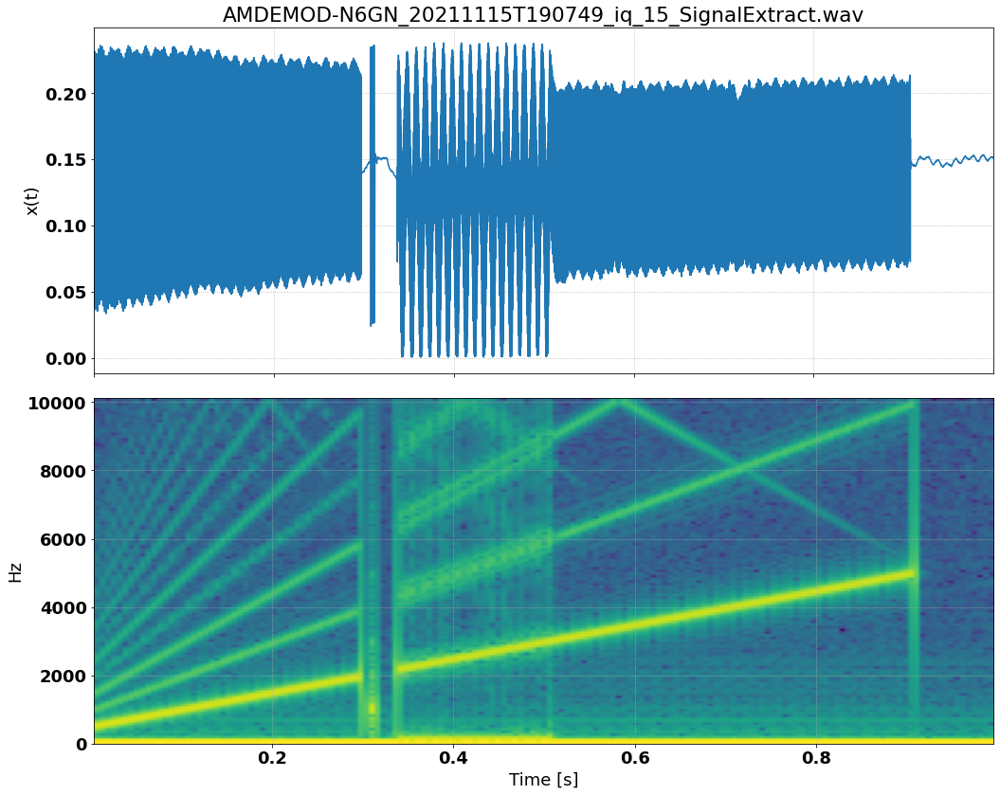

In [29]:
plot_signal(t, s, title='AMDEMOD-N6GN_20211115T190749_iq_15_SignalExtract.wav')

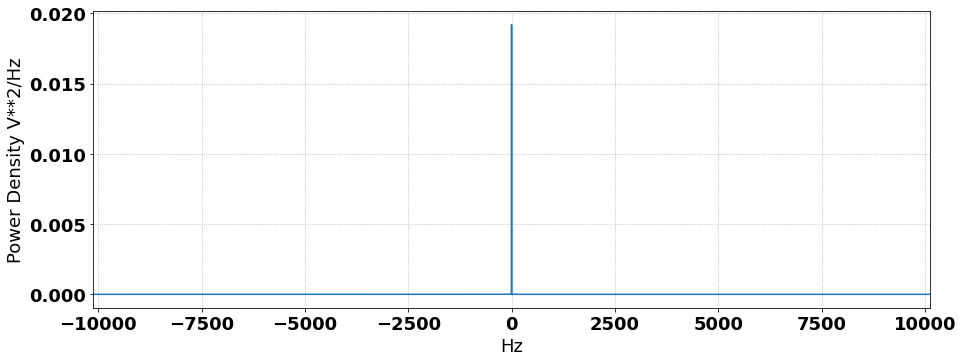

In [30]:
# https://numpy.org/doc/stable/reference/routines.fft.html
N = len(s)
SNf     = np.fft.fft(s,norm='ortho')
SNf     = np.fft.fftshift(SNf)
SNf_pwr = (np.abs(SNf)**2)/(N)

f       = np.fft.fftfreq(N,d=1./fs_wav1)
f       = np.fft.fftshift(f)

fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
ax.plot(f,SNf_pwr)
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
plt.show()

In [31]:
np.sum(SNf_pwr)

0.021985665764521482

In [63]:
samp_bw    = 50                 # Desired Bandwidth of Sample

df         = f[1]-f[0]
samp_N     = int(samp_bw/df)

s_samp_0     = 500                # Starting Frequency of signal sample bandwidth
s_samp_0_inx = np.argmin(np.abs(f-s_samp_0))
s_samp_1_inx = s_samp_0_inx + samp_N

print('Signal Sample Frequency Range: ',f[s_samp_0_inx], f[s_samp_1_inx])
print('Signal Sample Index Range: ',(s_samp_0_inx,s_samp_1_inx))





Signal Sample Frequency Range:  500.0 550.0
Signal Sample Index Range:  (10624, 10674)


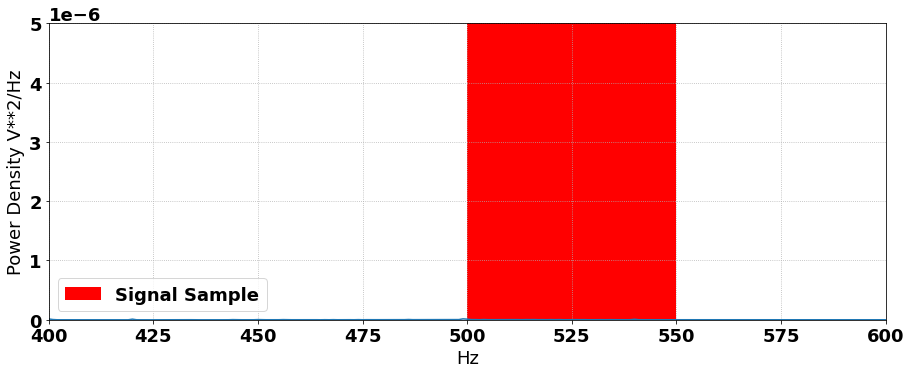

In [64]:
fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
plt.ylim(0,0.000005)
plt.xlim(400,600)
ax.plot(f,SNf_pwr)
ax.axvspan(f[s_samp_0_inx], f[s_samp_1_inx],label='Signal Sample',fc='r')
#ax.axvspan(f[n_samp_0_inx], f[n_samp_1_inx],label='Noise Sample',fc='y')
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
ax.legend(loc='lower left')
plt.show()

In [68]:
Sf_samp     = SNf[s_samp_0_inx:s_samp_1_inx]
Sf_samp_pwr = np.sum((np.abs(Sf_samp)**2)/len(Sf_samp))
print("Sf_samp_power: {:2f}".format(Sf_samp_pwr))


Sf_samp_power: 0.000049


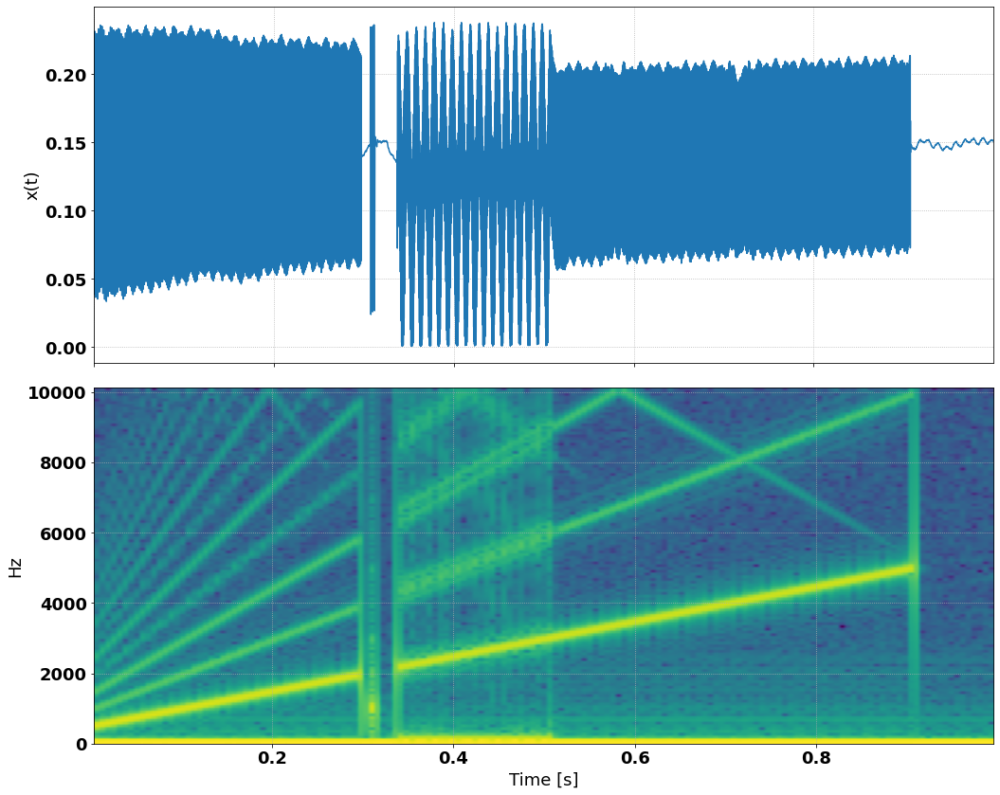

In [69]:
plot_signal(np.arange(len(s))*1./fs_wav1, s)

# Extract Noise

In [70]:
n, t = extract(wav1, 45, 46, fs_wav1)

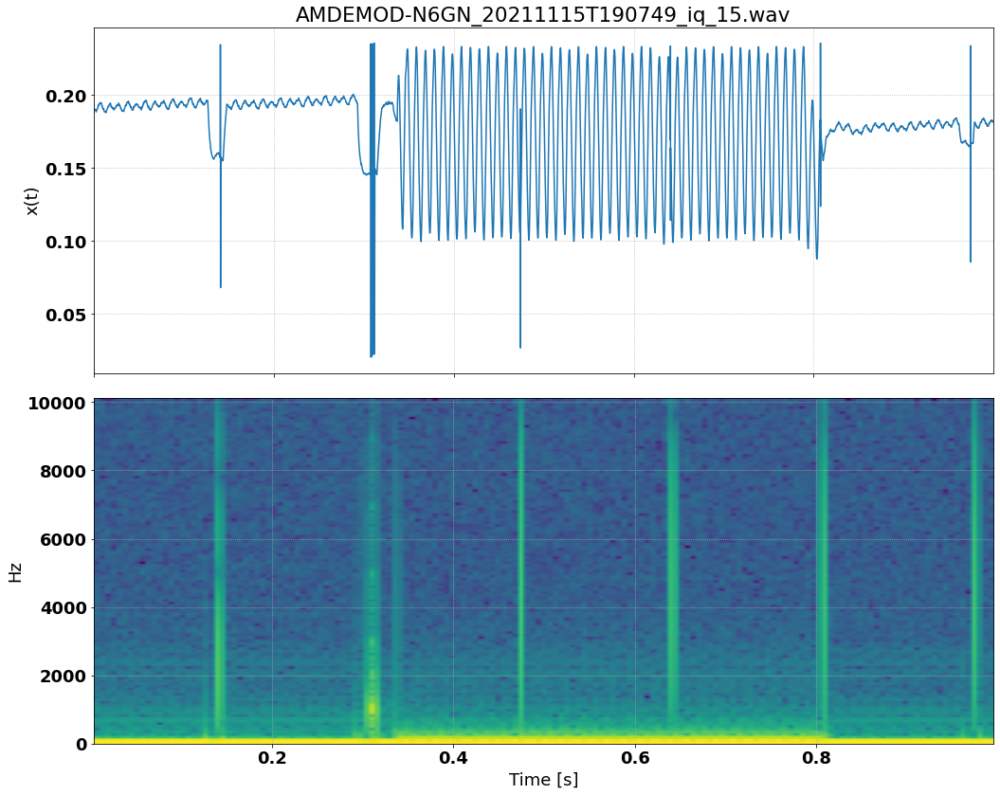

In [71]:
plot_signal(t, n, title='AMDEMOD-N6GN_20211115T190749_iq_15.wav')

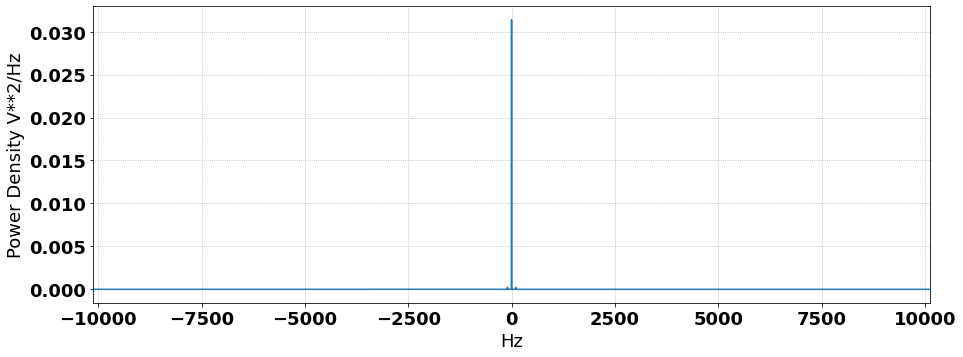

In [72]:
# https://numpy.org/doc/stable/reference/routines.fft.html
N = len(n)
SNf     = np.fft.fft(n,norm='ortho')
SNf     = np.fft.fftshift(SNf)
SNf_pwr = (np.abs(SNf)**2)/(N)

f       = np.fft.fftfreq(N,d=1./fs_wav1)
f       = np.fft.fftshift(f)

fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
ax.plot(f,SNf_pwr)
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
plt.show()

In [73]:
np.sum(SNf_pwr)

0.032501188454727485

In [140]:
samp_bw    = 50                 # Desired Bandwidth of Sample

df         = f[1]-f[0]
samp_N     = int(samp_bw/df)

n_samp_0     = 1800              # Starting Frequency of signal sample bandwidth
n_samp_0_inx = np.argmin(np.abs(f-n_samp_0))
n_samp_1_inx = n_samp_0_inx + samp_N

print('Noise Sample Frequency Range: ',f[n_samp_0_inx], f[n_samp_1_inx])
print('Noise Sample Index Range: ',(n_samp_0_inx,n_samp_1_inx))

Noise Sample Frequency Range:  1800.0 1850.0
Noise Sample Index Range:  (11924, 11974)


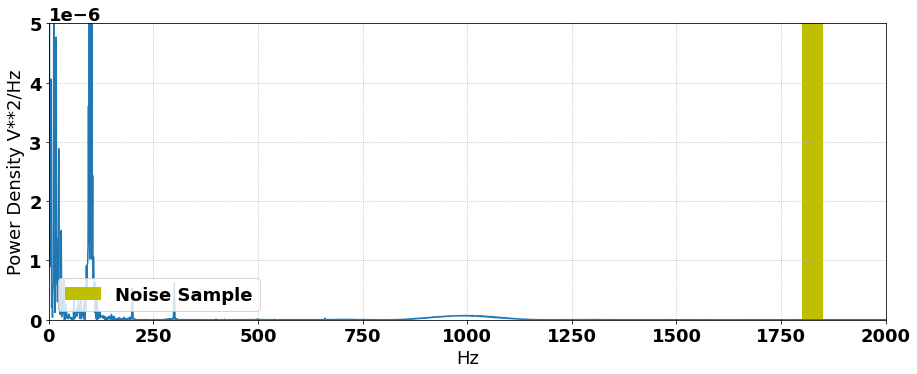

In [146]:
fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
plt.ylim(0,0.000005)
plt.xlim(0,2000)
ax.plot(f,SNf_pwr)
#ax.axvspan(f[s_samp_0_inx], f[s_samp_1_inx],label='Signal Sample',fc='r')
ax.axvspan(f[n_samp_0_inx], f[n_samp_1_inx],label='Noise Sample',fc='y')
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
ax.legend(loc='lower left')
plt.show()

In [147]:
Nf_samp     = SNf[n_samp_0_inx:n_samp_1_inx]
Nf_samp_pwr = np.sum((np.abs(Nf_samp)**2)/len(Nf_samp))

In [148]:
SNR_estimate    = ((Sf_samp_pwr-Nf_samp_pwr)/Nf_samp_pwr)
SNR_estimate_dB = 10.*np.log10(SNR_estimate)

print('SNR_estimate: ',SNR_estimate)
print('SNR_estimate_dB: ',SNR_estimate_dB)

SNR_estimate:  4.11421860290875
SNR_estimate_dB:  6.142873635655008
